# Group 14 - Project FP01
## Time series anomaly detection - Isolation Forest Classifier

This project aims at investigating the current state-of-the-arts TAD scenario.

In [1]:
# %pip install --no-binary :all: -r requirements.txt

In [2]:
# %pip install numpy==1.26.4
# %pip install pandas==1.5.3
# %pip install tensorflow
# %pip install tsfel
# %pip install keras_tuner
# %pip install -U kaleido
# %pip install seaborn
# %pip install plotly
# %pip install openpyxl

In [3]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest

from src.dataset import get_df_action, get_features_ts, get_train_test_data, label_collision_data
from src.plots import seaborn_cm, create_and_plot_cm, plot_uncertainty, plot_signals, plot_anomalies, plot_anomalies_over_time_isolation_forest, plot_roc_curve
from src.metrics import Confidence, anomaly_detection_metric, compute_metrics

# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

# Set style for matplotlib
plt.style.use("Solarize_Light2")

In [4]:
# from google.colab import drive
# drive.mount('/content/drive')

In [5]:
# Path to the root directory of the dataset
ROOTDIR_DATASET_NORMAL =  './dataset/normal' #'/content/drive/MyDrive/dataset/normal'
ROOTDIR_DATASET_ANOMALY = './dataset/collisions'#'/content/drive/MyDrive/dataset/collisions'

# TF_ENABLE_ONEDNN_OPTS=0 means that the model will not use the oneDNN library for optimization

import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'

### Dataset: Kuka-v1
In 5 different recording sessions, the robot executes several different operations, while being
monitored by several sensors. The sensed signals are collected, with different sampling frequencies
(1, 10, 100, 200 Hz),

### Data Loading

In [6]:
#freq = '1.0'
freq = '0.1'
#freq = '0.01'
#freq = '0.005'

# NORMAL DATA
filepath_csv = [os.path.join(ROOTDIR_DATASET_NORMAL, f"rec{r}_20220811_rbtc_{freq}s.csv") for r in [0, 2, 3, 4]]
filepath_meta = [os.path.join(ROOTDIR_DATASET_NORMAL, f"rec{r}_20220811_rbtc_{freq}s.metadata") for r in [0, 2, 3, 4]]
df_action, df, df_meta, action2int = get_df_action(filepath_csv, filepath_meta)


# COLLISION DATA
xls = pd.ExcelFile(os.path.join(ROOTDIR_DATASET_ANOMALY, "20220811_collisions_timestamp.xlsx"))
collision_rec1 = pd.read_excel(xls, 'rec1')
collision_rec5 = pd.read_excel(xls, 'rec5')

collisions = collision_rec1
collisions_init = collisions[collisions['Inizio/fine'] == "i"].Timestamp - pd.to_timedelta([2] * len(collisions[collisions['Inizio/fine'] == "i"].Timestamp), 'h')

collisions_adjusted = collisions.Timestamp - pd.to_timedelta([2] * len(collisions.Timestamp), 'h')
# transform in like collision
collisions['Timestamp'] = collisions_adjusted

filepath_csv = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.csv") for r in [1, 5]]
filepath_meta = [os.path.join(ROOTDIR_DATASET_ANOMALY, f"rec{r}_collision_20220811_rbtc_{freq}s.metadata") for r in [1, 5]]
df_action_collision, df_collision, df_meta_collision, action2int_collision = get_df_action(filepath_csv, filepath_meta)

Loading data.
Found 31 different actions.
Loading data done.

Loading data.
Found 31 different actions.
Loading data done.



### Features Exctraction

In [7]:
start_time = time.time()
frequency = 1/float(freq)
df_features = get_features_ts("statistical", df_action, df_meta, frequency, action2int)
df_features_collision = get_features_ts("statistical", df_action_collision, df_meta_collision, frequency, action2int_collision)
print("--- %s seconds ---" % (time.time() - start_time))

Computing features.


Skipped feature extraction for pickFromPallet(1,2)=[true,1,0] 2022-08-11 14:37:37.436000 : 2022-08-11 14:37:37.421000.
Skipped feature extraction for placeToPallet(1,1)=[true,0] 2022-08-11 14:37:37.421000 : 2022-08-11 14:37:37.442000.
Skipped feature extraction for pickFromPallet(3,2)=[true,1,0] 2022-08-11 15:36:32.568000 : 2022-08-11 15:36:32.533000.
Skipped feature extraction for pickFromPallet(3,2)=[true,1,0] 2022-08-11 15:36:32.572000 : 2022-08-11 15:36:32.561000.
Skipped feature extraction for placeToPallet(1,3)=[true,0] 2022-08-11 15:36:32.533000 : 2022-08-11 15:36:32.572000.
Skipped feature extraction for placeToPallet(1,3)=[true,0] 2022-08-11 15:36:32.561000 : 2022-08-11 15:36:32.561000.
Computing features done.
Computing features.


Skipped feature extraction for moveOverPallet(1,3)=[true,0] 2022-08-11 16:55:15.149000 : 2022-08-11 16:55:15.146000.
Skipped feature extraction for moveOverPallet(3,1)=[true,0] 2022-08-11 16:55:15.146000 : 2022-08-11 16:55:15.150000.
Computing features done.
--- 161.41553330421448 seconds ---


In [8]:
X_train, y_train, X_test, y_test, X_test_start_end = get_train_test_data(df_features, df_features_collision)

X_train shape: (973, 2200)
y_train shape: (973,)
X_test shape: (306, 2200)
y_test shape: (306,)
X_train shape: (973, 96)
y_train categorical shape: (973, 31)
y_train shape: (973,)
X_test shape: (306, 96)
y_test shape: (306,)


In [9]:
df_with_labels = label_collision_data(df_features_collision, collisions_init)
y_test_collision = df_with_labels["is_collision"]

Trying to take collision_zones



In [10]:
ts_starts = collisions[collisions['Inizio/fine'] == 'i'].Timestamp.reset_index()
ts_ends = collisions[collisions['Inizio/fine'] == 'f'].Timestamp.reset_index()

d = {'start': ts_starts.Timestamp, 'end': ts_ends.Timestamp}
collision_zones = pd.DataFrame(d)


## Isolation Forest

In [61]:
num_estims = [10, 100, 1000]
contamination_s = ["auto", 0.005, 0.001, 0.001, 0.03, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5]
contamination_s += np.linspace(0.03, 0.1, 25).tolist()
clf_s = []

#Variare contamination è come variare threshold
for cont in contamination_s:
    classifier = IsolationForest(
        n_estimators=100,
        max_samples=10,
        contamination = cont
    )
    # Train the RandomForestClassifier on normal data
    classifier.fit(X_train, y_train)
    clf_s.append(classifier)
    print("Random Forest training completed.")


Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest training completed.
Random Forest 

In [62]:
pred_s = []
# For each of the trained clasisfier make a prediction
for clf in clf_s:
    try:
        anomalies_detected = clf.predict(X_test)
        pred_s.append(anomalies_detected)
    except Exception as e:
        print(f"An error occurred during prediction: {str(e)}")
        # If an error occurs, you might want to inspect the model's internal state

    print(f"Number of anomalies detected: {-np.sum(anomalies_detected[anomalies_detected == -1])} with contamination {clf.get_params()['contamination']}")
    # Pretty useless in questo contesto
    # _ = plot_anomalies(anomalies_detected, freq, clf.get_params()['contamination'], "ISOLATION FOREST")


Number of anomalies detected: 0 with contamination auto
Number of anomalies detected: 23 with contamination 0.005
Number of anomalies detected: 0 with contamination 0.001
Number of anomalies detected: 0 with contamination 0.001
Number of anomalies detected: 2 with contamination 0.03
Number of anomalies detected: 22 with contamination 0.05
Number of anomalies detected: 13 with contamination 0.1
Number of anomalies detected: 39 with contamination 0.2
Number of anomalies detected: 112 with contamination 0.3
Number of anomalies detected: 120 with contamination 0.4
Number of anomalies detected: 223 with contamination 0.5
Number of anomalies detected: 30 with contamination 0.03
Number of anomalies detected: 22 with contamination 0.032916666666666664
Number of anomalies detected: 41 with contamination 0.035833333333333335
Number of anomalies detected: 22 with contamination 0.03875
Number of anomalies detected: 19 with contamination 0.041666666666666664
Number of anomalies detected: 24 with co

### Anomaly Detection

In [63]:
# anomaly_scores = None
# try:
#     anomaly_scores = classifier.predict(X_test)
#     # Replace inf values with the maximum float value
#     anomaly_scores = np.nan_to_num(anomaly_scores, nan=np.nanmean(anomaly_scores), posinf=np.finfo(float).max, neginf=np.finfo(float).min)
# except Exception as e:
#     print(f"An error occurred during prediction: {str(e)}")
#     # If an error occurs, you might want to inspect the model's internal state
# print("Anomaly prediction completed.")

In [64]:
# anomaly_scores  #qua -1 sta per outlier, mentre 1 sta per inlier, Quindi non sono scores, ma predcitions dirette

In [65]:
# threshold_1 = np.mean(anomaly_scores) + 2 * np.std(anomaly_scores)

In [66]:
# median = np.median(anomaly_scores)
# mad = np.median(np.abs(anomaly_scores - median))
# threshold_2 = median + 3 * mad

In [67]:
# threshold_3 = np.percentile(anomaly_scores, 95)

In [68]:
# Q1 = np.percentile(anomaly_scores, 25)
# Q3 = np.percentile(anomaly_scores, 75)
# IQR = Q3 - Q1
# threshold_4 = Q3 + 1.5 * IQR

In [69]:
# for threshold in [threshold_1, threshold_2, threshold_3, threshold_4]:
#     anomalies_detected = sum(anomaly_scores >= threshold)
#     print(f"Number of anomalies detected: {anomalies_detected} with threshold {threshold}")

In [70]:
for idx, pred in enumerate(pred_s):
    #ATTENZIONE, mapping delle anomalie da dominio [-1, 1] a [0, 1]
    # pred[pred == -1] = 0
    compute_metrics(pred, y_test_collision, clf_s[idx].get_params()['contamination'])

ROC AUC Score: 0.5000
Detected anomaly class: 0


ValueError: Unknown format code 'f' for object of type 'str'

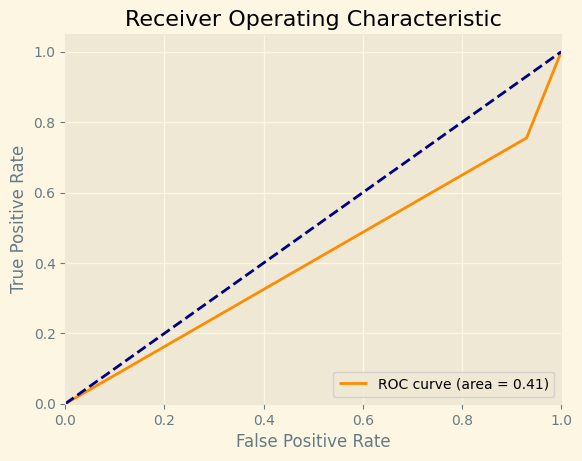

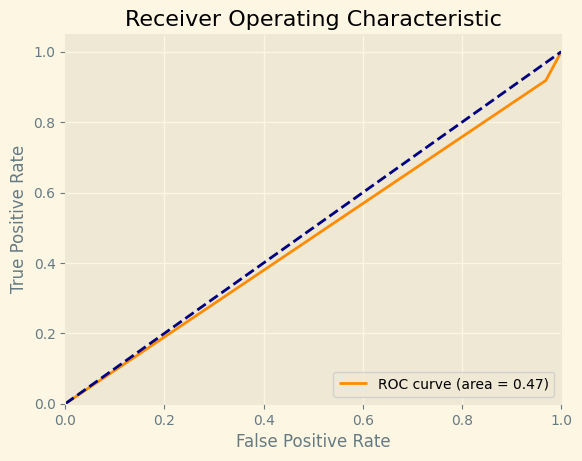

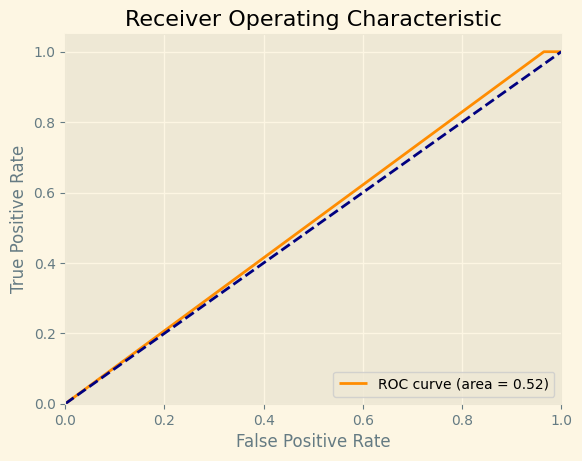

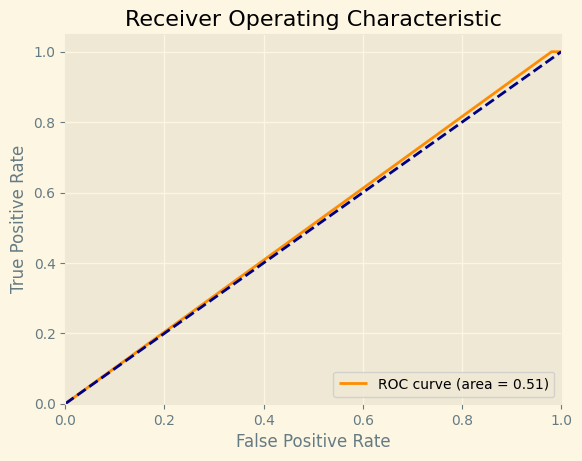

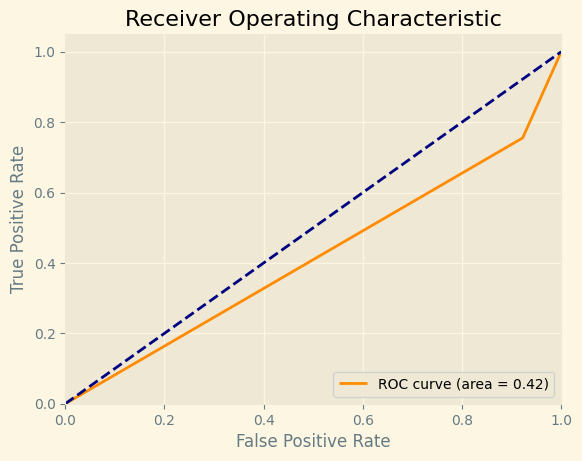

...

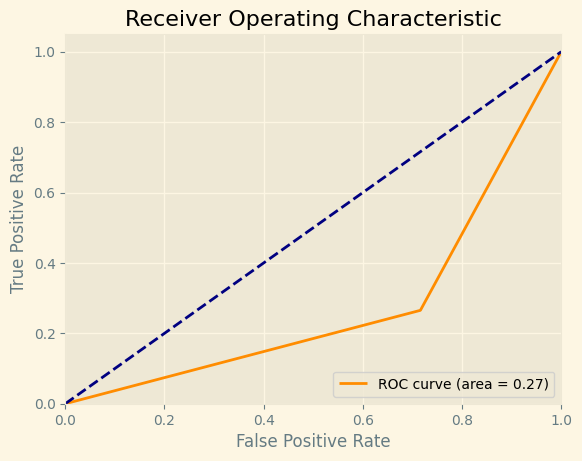

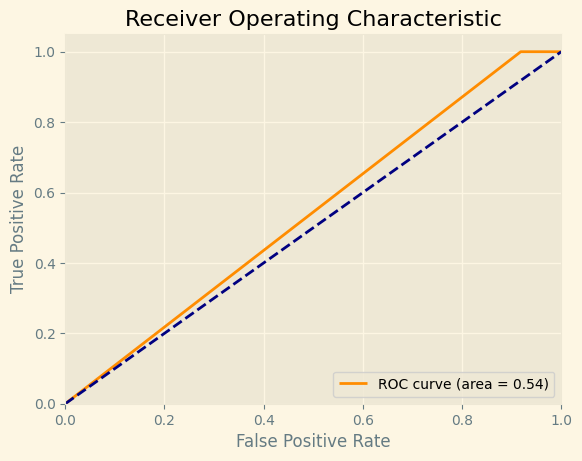

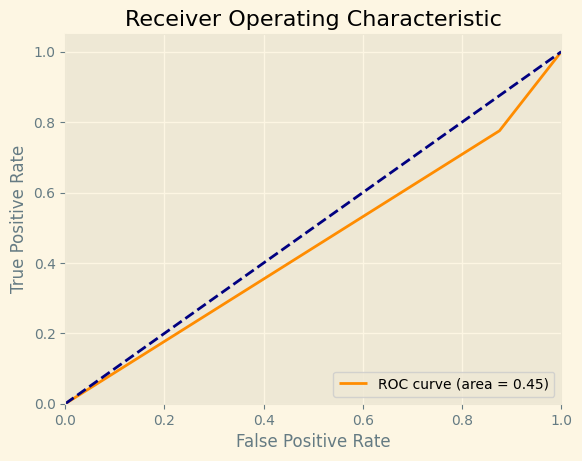

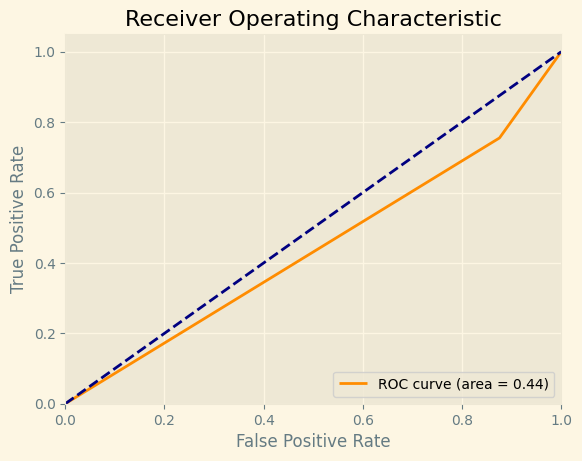

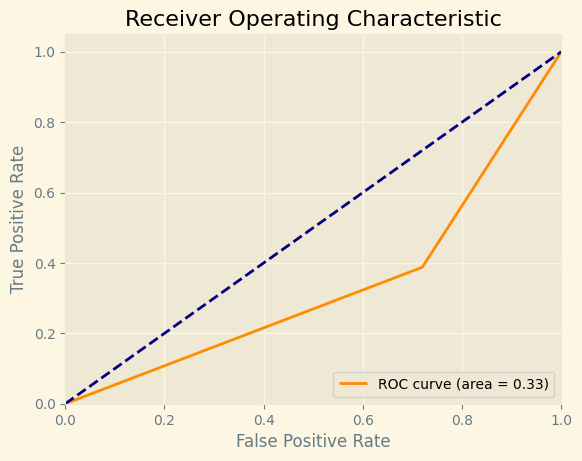

In [ ]:
for pred in pred_s:
    plot_roc_curve(y_test_collision.values, pred)

## Map anomalies to original time series

In [ ]:
def plot_anomalies_over_time_isolation_forest(X_test, pred, freq, collision_zones, X_test_start_end):
    # Step 1: Create a DataFrame with the original data and anomaly scores
    df = X_test.copy()

    # Step 2: Add a timestamp column since it doesn't exist
    df['timestamp'] = pd.date_range(start=X_test_start_end['start'].to_list()[0], end=X_test_start_end['end'].to_list()[-1], periods=len(df))  #Qua assicurati di bindare bene i timestamp (se puoi, non generarli)

    # Step 3: Select a few features to plot along with the anomaly scores
    features_to_plot = df.columns.drop(['timestamp'])

    # Step 4: Create the plot
    fig, ax1 = plt.subplots(figsize=(15, 6))
    ax1.set_title(f'Time Series Data with Anomaly Scores at frequency {freq}', fontsize=16)
    
    # Plot features on primary y-axis
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Feature Values')
    colors = plt.cm.Greys(np.linspace(0, 1, len(features_to_plot)))
    lines = []  # To collect plot lines for legend
    labels = []  # To collect plot labels for legend
    
    # print(f"THRESH: {threshold}")
    for feature, color in zip(features_to_plot, colors):
        # if any(df[feature] > threshold):
        line, = ax1.plot(df['timestamp'], df[feature], label=f'Feature: {feature}', linewidth=1, color=color, alpha=0.7)
        lines.append(line)
        labels.append(f'Feature: {feature}')
        # else:
            # print("\t\tQuesta feature non supera mai soglia")

    #Highlighting collision zones on the graph
    for s, e in zip(collision_zones['start'].tolist(), collision_zones['end'].tolist()):
        ax1.axvspan(s, e, alpha=0.2, color='blue')

    # ax1.plot(df['timestamp'], df['anomaly_score'], color='red', label='Anomaly Score', linestyle='--', linewidth=1)
    ax1.plot(df['timestamp'], pred, 'go-', label='Anomaly Score', linestyle='--', linewidth=1)

    fig.tight_layout()
    plt.show()

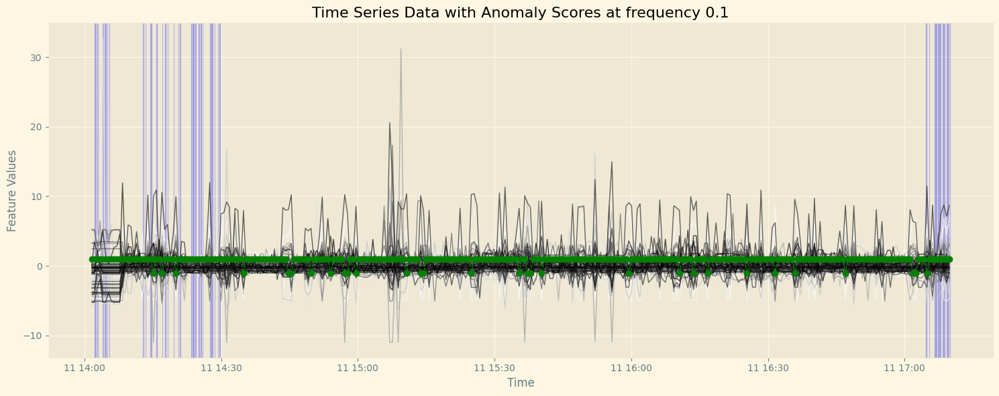

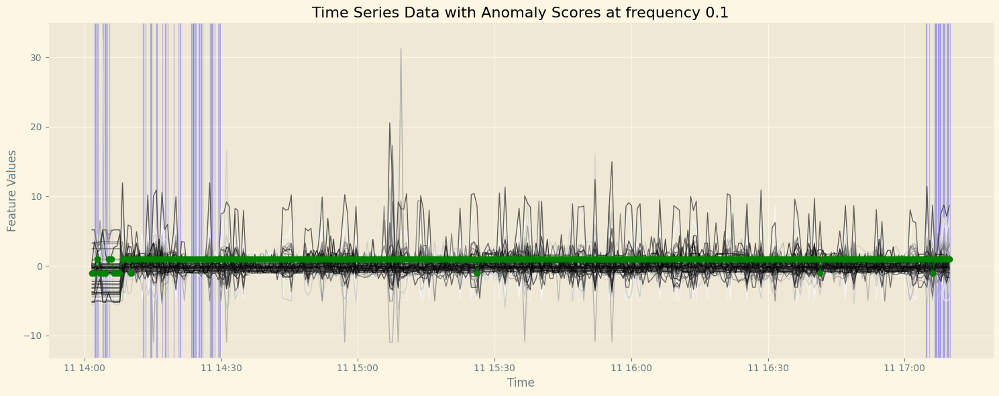

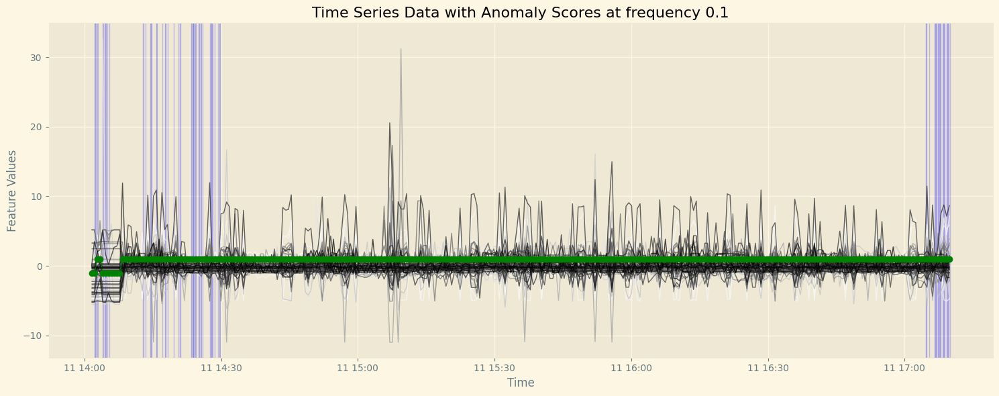

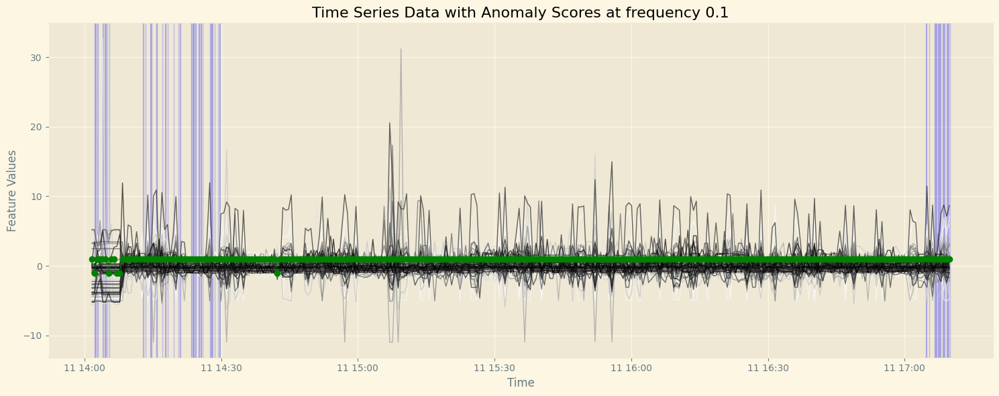

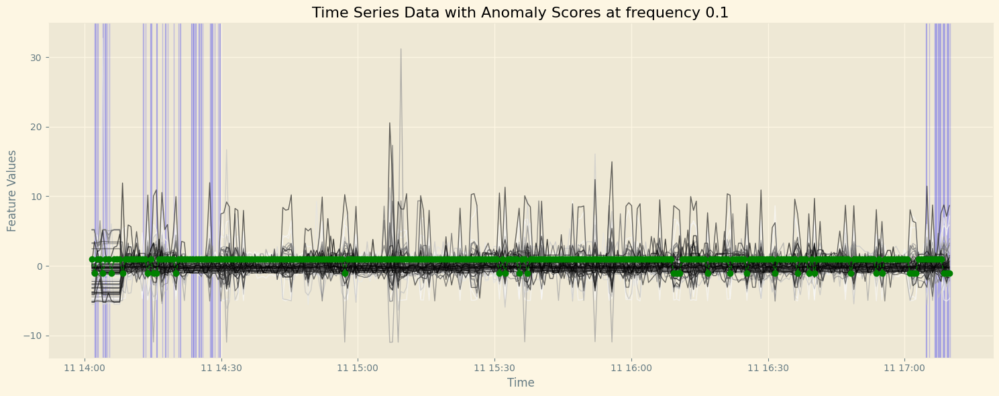

...

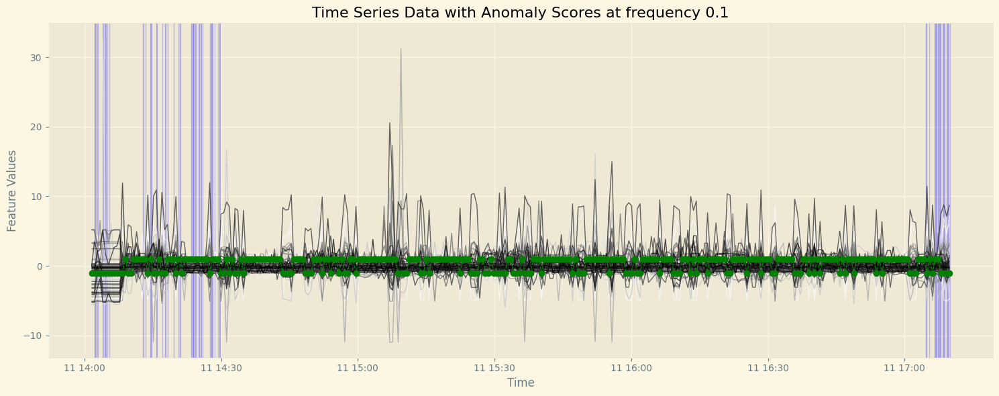

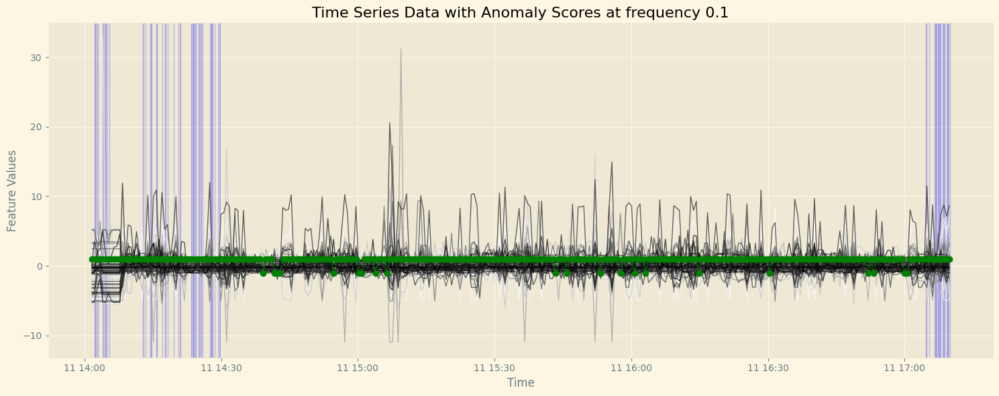

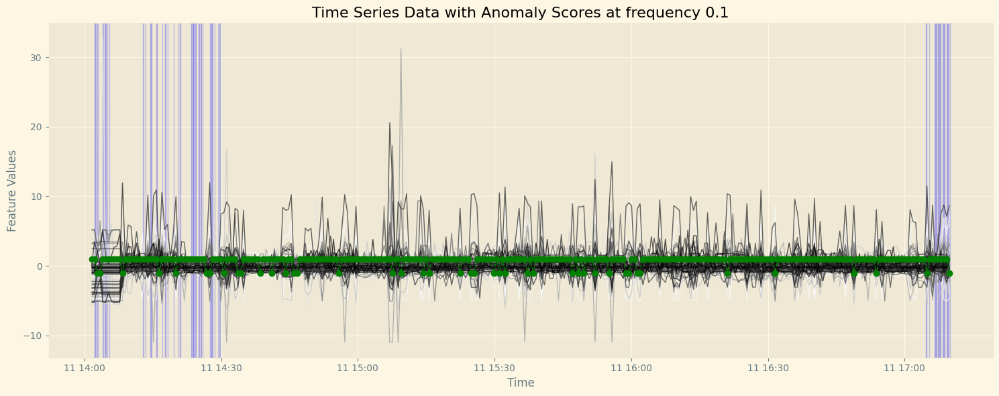

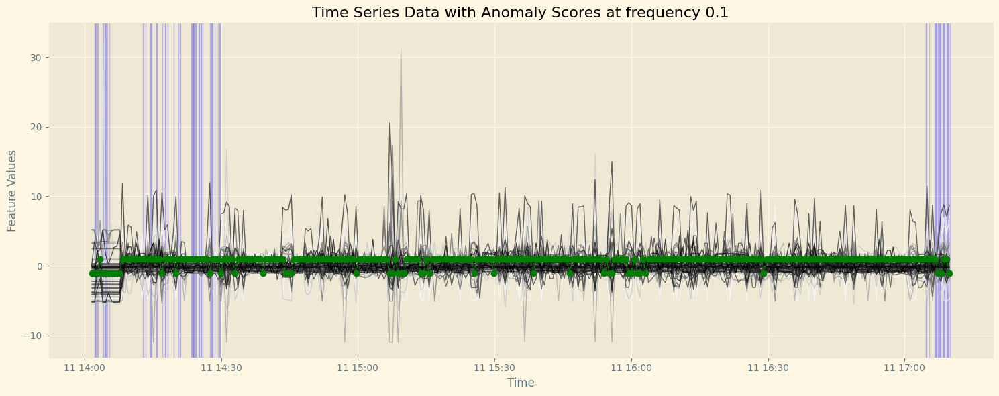

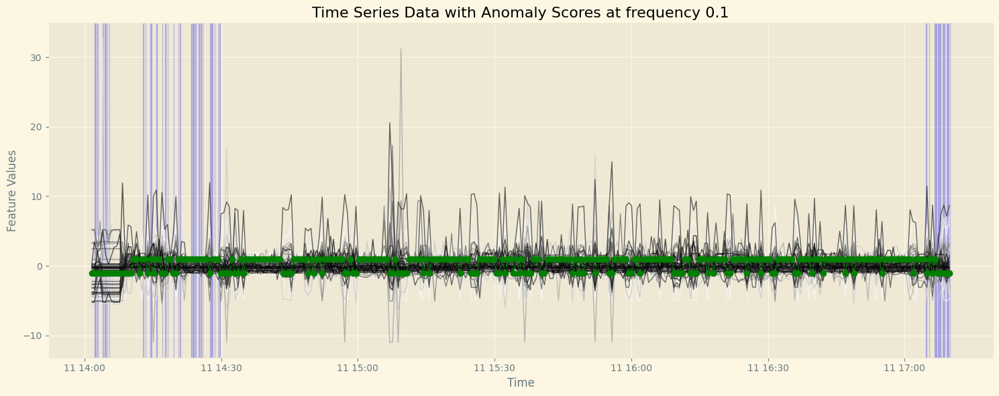

In [ ]:
for pred in pred_s:
    plot_anomalies_over_time_isolation_forest(X_test, pred, freq, collision_zones, X_test_start_end)